In this notebook, we ran scopes for the aldehyde dataset.

In [1]:
from pathlib import Path
import os
import sys

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from matplotlib.lines import Line2D
from matplotlib import gridspec
from matplotlib.colors import Normalize
import colorsys
import numpy as np
import pandas as pd
from rdkit.Chem import AllChem
from rdkit.Chem import Draw
from rdkit import Chem
from scipy.cluster import hierarchy
from scipy.cluster.hierarchy import linkage, fcluster
from scipy.spatial.distance import cdist
import seaborn as sns
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import scale
from umap import UMAP
sys.path.append(os.path.abspath(os.path.join('..','..')))
from Code.benchmark import Benchmark
from Code.predictor import ScopeBO


# Doyle colors
doyle_colors = ["#CE4C6F", "#1561C2", "#188F9D","#C4ADA2","#515798", "#CB7D85", "#A9A9A9"]
# extension of palette with lighter and darker versions
def adjust_lightness(color, factor=1.2):
    """
    Function to make colors lighter (factor > 1) or darker (factor < 1).
    """
    r, g, b = mcolors.to_rgb(color)
    h, l, s = colorsys.rgb_to_hls(r, g, b)
    l = max(0, min(1, l * factor))
    r, g, b = colorsys.hls_to_rgb(h, l, s)
    return mcolors.to_hex((r, g, b))

lighter = [adjust_lightness(c, 1.2) for c in doyle_colors]
darker  = [adjust_lightness(c, 0.7) for c in doyle_colors]
all_colors = doyle_colors + darker[::-1] + lighter[::-1] 

# Save the categorical colormap
cat_cmap = ListedColormap(all_colors, name="Doyle_cat")
plt.colormaps.register(cat_cmap)

# Define and save a continuous colormap
colors = [doyle_colors[1],"#FFFFFFD1",doyle_colors[0]]
cont_cmap = LinearSegmentedColormap.from_list("Doyle_cont", colors)
plt.colormaps.register(cont_cmap)

wdir = Path(".")

# General plt parameters
plt.rcParams.update({
    "axes.titlesize": 20,        # Subplot title
    "axes.labelsize": 16,        # X and Y labels
    "figure.titlesize": 24,      # Suptitle
    "xtick.labelsize": 14,       # X tick labels
    "ytick.labelsize": 14,       # Y tick labels
    "legend.fontsize": 14,       # Legend text
    "legend.title_fontsize": 14  # Legend titles
})

# Scope score definition

In order to calculate scope scores for this dataset, we first established objective bounds for the normalization of them using the workflow established in the hyperparameter optimization for the ArI oxidative addtion dataset.

In [2]:
# Read in the labelled dataset and scale it
df_labelled = pd.read_csv(f"./cho_dset.csv", index_col=0,header=0)
df_data = df_labelled.copy(deep=True)
df_data = df_data.drop(columns=['conversion','selectivity'])  # drop the objective values
df_data = pd.DataFrame(scale(df_data),df_data.index,df_data.columns)
objectives = ["conversion","selectivity"]
wdir = Path(".")

# Make a UMAP for visualization of the results
fit = UMAP(n_neighbors=40,min_dist=0.7,n_components=2,metric="euclidean",random_state=12)
df_umap = pd.DataFrame(fit.fit_transform(df_data),df_data.index,["UMAP1","UMAP2"])
df_umap.to_csv("cho_UMAP_coords.csv")


In [3]:
# # Low vendi and high objective bounds with the greedy acquisition function without pruning
# run_settings = {1: 0, 3: 0, 4: 0,2: 0}

# for batch_size in run_settings.keys():
#     Benchmark().collect_data(
#         filename_labelled = f"./cho_dset.csv",
#         name_results = f"./Results_Data/bounds/greedy40_b{batch_size}",
#         objectives=['conversion',"selectivity"],
#         budget = 40,
#         batches= [batch_size],
#         Vendi_pruning_fractions = [run_settings[batch_size]],
#         seeds = 40,
#         acquisition_function_mode= "greedy",
#         pruning_metric= "vendi_batch",
#         init_sampling_method="random")

In [4]:
# # High vendi and low objective bounds with the explorative acquisition function with max pruning for the respective batch size
# run_settings = {1: 10, 3: 31, 4: 40, 2: 21}
# for batch_size in run_settings.keys():
#     Benchmark().collect_data(
#         filename_labelled = f"./cho_dset.csv",
#         name_results = f"./Results_Data/bounds/explorative40_b{batch_size}",
#         objectives=['conversion',"selectivity"],
#         budget = 40,
#         batches= [batch_size],
#         Vendi_pruning_fractions = [run_settings[batch_size]],
#         seeds = 40,
#         acquisition_function_mode= "explorative",
#         pruning_metric= "vendi_batch",
#         init_sampling_method="random")

Get the objective and Vendi score bounds by analyzing the scopes

In [3]:
# Use the results of the greedy acqusition function (no pruning) with scope size 40, to get the upper bounds for the conversion and the upper bounds for the selectivity 
# and the vendi score.
dfs_bounds_greedy = {}
for metric in ["conversion","selectivity","vendi"]:
    dfs_metric = {}
    for batch_size in [1,2,3,4]:
        dfs_metric[batch_size] = Benchmark().heatmap_plot(type_results=metric,name_results=f"./Results_Data/bounds/greedy40_b{batch_size}",budget=40,show_plot=False)
    greedy_values = pd.concat(dfs_metric,axis=1)
    greedy_values.columns = [1,2,3,4]
    greedy_values = greedy_values.stack().reset_index(drop=True)
    dfs_bounds_greedy[metric] = pd.DataFrame({metric: greedy_values})
bounds_greedy = pd.concat(dfs_bounds_greedy,axis=1)
bounds_greedy.columns = ["conversion","selectivity","vendi"]
conversion_max = bounds_greedy["conversion"].max()
selectivity_max = bounds_greedy["selectivity"].max()
vendi_min = bounds_greedy["vendi"].min()
print(f"upper bounds conversion: {conversion_max}")
print(f"upper bounds selectivity: {selectivity_max}")
print(f"lower bounds vendi score: {vendi_min}")

upper bounds conversion: 90.6340625
upper bounds selectivity: 1.2967363036066584
lower bounds vendi score: 1.833416342650975


In [4]:
# Use the results of the explorative acqusition function (max pruning) with scope size 40, to get the lower bounds for the conversion and the lower bounds for the selectivity 
# and the upper bounds for the vendi score.
dfs_bounds_explorative = {}
for metric in ["conversion","selectivity","vendi"]:
    dfs_metric = {}
    for batch_size in [1,2,3,4]:
        dfs_metric[batch_size] = Benchmark().heatmap_plot(type_results=metric,
                                                          name_results=f"./Results_Data/bounds"\
                                                            f"/explorative40_b{batch_size}",
                                                            budget=40,show_plot=False)
    explorative_values = pd.concat(dfs_metric,axis=1)
    explorative_values.columns = [1,2,3,4]
    explorative_values = explorative_values.stack().reset_index(drop=True)
    dfs_bounds_explorative[metric] = pd.DataFrame({metric: explorative_values})
bounds_explorative = pd.concat(dfs_bounds_explorative,axis=1)
bounds_explorative.columns = ["conversion","selectivity","vendi"]
conversion_min = bounds_explorative["conversion"].min()
selectivity_min = bounds_explorative["selectivity"].min()
vendi_max = bounds_explorative["vendi"].max()
print(f"lower bounds conversion: {conversion_min}")
print(f"lower bounds selectivity: {selectivity_min}")
print(f"upper bounds vendi score: {vendi_max}")

lower bounds conversion: 74.35156250000003
lower bounds selectivity: 1.1718187970018277
upper bounds vendi score: 5.580807145374729


In [5]:
# Record the bounds
conversion_bounds = (conversion_max,conversion_min)
selectivity_bounds = (selectivity_max,selectivity_min)
vendi_bounds = (vendi_max,vendi_min)
bounds = {"conversion":conversion_bounds,"vendi":vendi_bounds,"selectivity":selectivity_bounds}

# Run the scopes

After having established the bounds for the objectives, we can run the scopes with different acquisition functions using the optimized conditions and also without Vendi pruning.

In [8]:
# for acq in ["balanced","greedy","random","explorative"]:
#     for pruning in [False,True]:
#         if pruning:
#             pruning_label = "pruning"
#             pruning_fractions = 13
#         else:
#             pruning_label = "no-pruning"
#             pruning_fractions = 0
#         Benchmark().collect_data(
#             filename_labelled = f"./cho_dset.csv",
#             name_results = f"./Results_Data/scope_{acq}_{pruning_label}",
#             objectives=['conversion',"selectivity"],
#             budget = 27,
#             batches= [3],
#             Vendi_pruning_fractions = [pruning_fractions],
#             seeds = 40,
#             acquisition_function_mode= acq,
#             pruning_metric= "vendi_batch",
#             init_sampling_method="random")

In [9]:
# # human-like conventional selection
# Benchmark().collect_data(
#     filename_labelled = f"./cho_dset.csv",
#     name_results = f"./Results_Data/scope_human-like-acq",
#     objectives=['conversion',"selectivity"],
#     budget = 27,
#     batches= [3],
#     Vendi_pruning_fractions = [5],
#     seeds = 40,
#     acquisition_function_mode= "greedy",
#     pruning_metric= "vendi_batch",
#     init_sampling_method="random")

# Analysis of baseline comparisons

Get the results

Scope score:


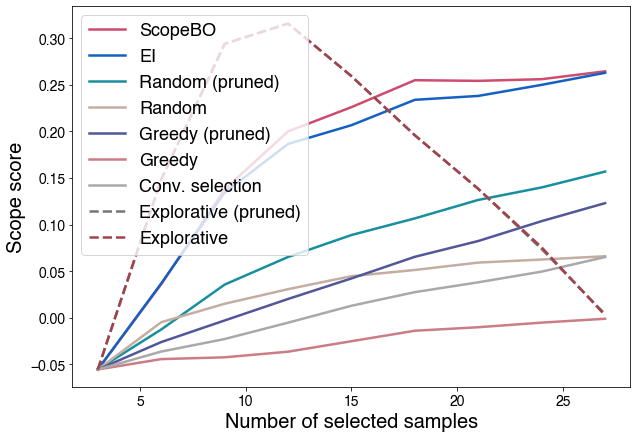

Average_objective:


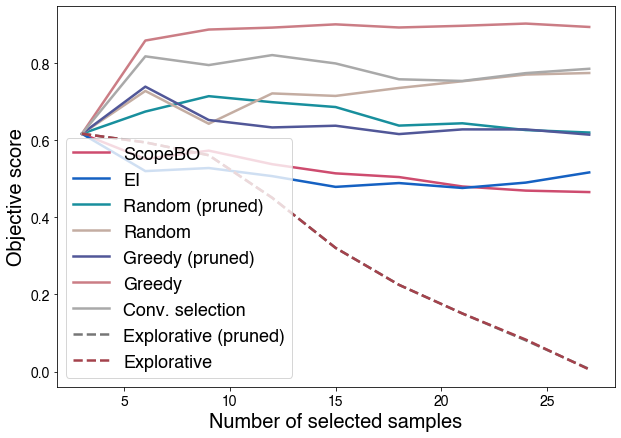

Conversion score:


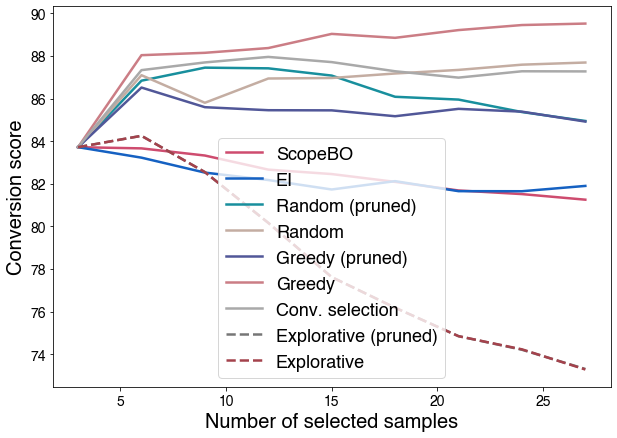

Selectivity score:


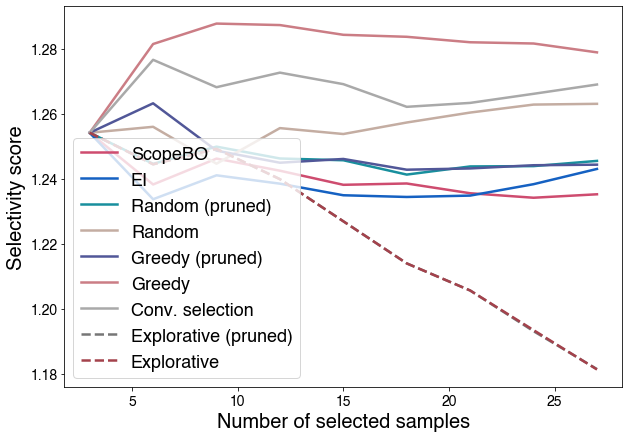

Vendi score:


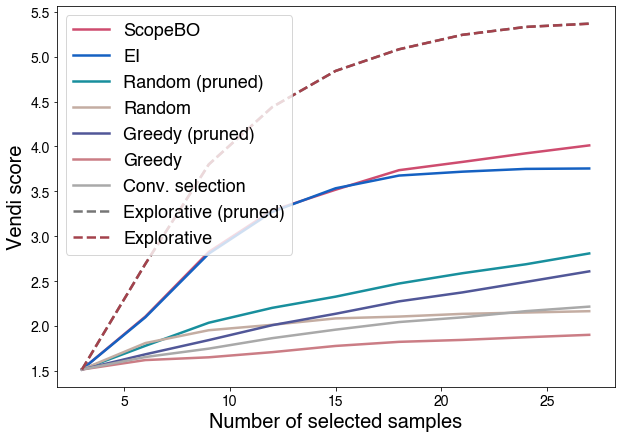

In [10]:
for type_results in ["Scope","Objective","Conversion","Selectivity","Vendi"]:
    dfs = {}
    for acq in ["EI","Random","Greedy","Conv. selection","Explorative"]:
        if acq == "EI":
            acq_label = "balanced"
        elif acq == "Conv. selection":
            acq_label = "human-like-acq"
        else:
            acq_label = acq.lower()
        for pruning in [True,False]:
            if pruning:
                pruning_label = "_pruning"
                pruning_flag = "with"
            else:
                pruning_label = "_no-pruning"
                pruning_flag = "without"
            if acq == "Conv. selection":
                pruning_label = ""
            dfs_progress = Benchmark().progress_plot(budget=27, type_results= type_results,
                                     name_results=f"./Results_Data/scope_{acq_label}{pruning_label}",show_plot=False,bounds=bounds)
            dfs[acq+pruning_label] = dfs_progress["means"]
    df_combined = pd.concat(dfs,axis=1)
    df_combined.columns = [multiindex[0] for multiindex in df_combined.columns]
    df_combined.rename(columns={"EI_pruning":"ScopeBO"},inplace=True)
    df_combined = df_combined[["ScopeBO"] + [col for col in df_combined.columns if col != "ScopeBO"]]
    label_dict = {col: col for col in df_combined.columns}
    for key,val in label_dict.items():
        if "_no-pruning" in val:
            label_dict[key] = val.split("_")[0]
        elif "pruning" in val:
            label_dict[key] = val.split("_")[0] + " (pruned)"
    df_combined.rename(columns=label_dict,inplace=True)
    if type_results == "Objective":
        print("Average_objective:")
    else:
        print(f"{type_results} score:")
    # Plot.
    plt.figure(figsize=(10,7))
    for j,col in enumerate(df_combined.columns):
        style = '-' if j <= 6 else '--' if j <= 13 else ':'
        plotting = df_combined[col][df_combined[col].notna()]
        plt.plot(plotting.index, plotting.values, label = col, color=all_colors[j], linestyle=style, linewidth=2.5)
    plt.xlabel('Number of selected samples',fontsize=20)
    plt.ylabel(f"{type_results} score",fontsize=20)
    plt.legend(fontsize=18)
    plt.show()

### Doyle clustering for comparison

In [11]:
# A scaled dataframe containing the features was already generated in the beginning of this notebook. Check how many dimensions there are.
print(f"There are {len(df_data.columns)} dimensions in the dataset.")

There are 41 dimensions in the dataset.


In [12]:
# define the dimensionalities of the reduced representation to study
dims = [41, 35, 30, 25, 20, 15, 10, 5, 2]

# function to calculate silhouette scores
def silhouette_scores_hierarchical(data, n_cls_list):
    """helper function to compute a silhouette score for hierarchical clustering using Ward linkage"""
    z = linkage(data, method='ward')
    result = pd.Series(index=n_cls_list, dtype=float)
    for n_cls in n_cls_list:
        cls = fcluster(z, n_cls, criterion='maxclust')
        result.loc[n_cls] = silhouette_score(data, cls)
    return result

# dictionary to store data at different levels of dimensionality reduction
n_neighbors = int(np.sqrt(df_data.shape[1]))
dfs = {}
for dim in dims:
    key = f"umap{dim}"
    dfs[key] = pd.DataFrame(UMAP(n_components=dim, n_neighbors=n_neighbors,
                                    random_state=0).fit_transform(df_data),index=df_data.index)

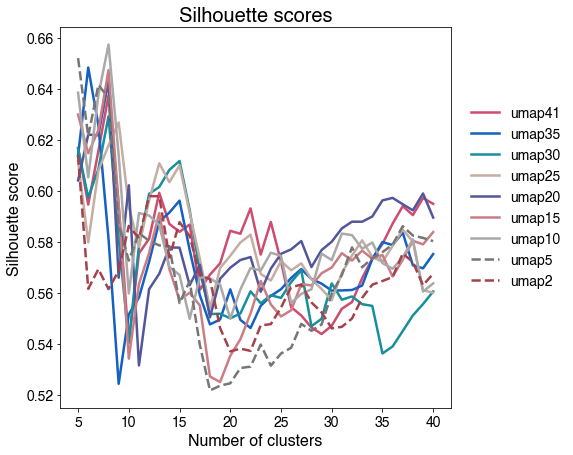

,Representation,Nr_clusters,Silh_score,Representation (min 15 clusters),Nr_clusters (min 15 clusters),Silh_score (min 15 clusters)
Results,umap10,8.0,0.657365,umap30,15.0,0.611717


In [13]:
# range of scope sizes to be studied
N_CLS_list = list(range(5,41))
# min number of clusters for the scope
min_clust = 15
# df to save the results of the silhouette score analysis
best_silh_scores = pd.DataFrame(np.nan,index=["Results"],columns=["Representation","Nr_clusters", "Silh_score",
                                                               f"Representation (min {min_clust} clusters)", 
                                                               f"Nr_clusters (min {min_clust} clusters)",
                                                               f"Silh_score (min {min_clust} clusters)"])

plt.figure(figsize=(7,7))
plt.title("Silhouette scores")
plt.xlabel("Number of clusters",fontsize=16)
plt.ylabel("Silhouette score",fontsize=16)

# populate silhouette scores for all number of clusters and all dimensionality reductions
silh_scores = pd.DataFrame(index=N_CLS_list)
for key, value in dfs.items():
    silh_scores[key] = silhouette_scores_hierarchical(value, N_CLS_list)
for j,col in enumerate(silh_scores.columns):
    style = '-' if j <= 6 else '--' if j <= 13 else ':'
    plotting = silh_scores[col][silh_scores[col].notna()]
    plt.plot(plotting.index, plotting.values, label = col, color=all_colors[j], linestyle=style, linewidth=2.5)

# record the representation that gives the best silhouette score
max_position = silh_scores.stack().idxmax()
best_silh_scores.loc["Results","Representation"] = max_position[1]
best_silh_scores.loc["Results","Nr_clusters"] = int(max_position[0])
best_silh_scores.loc["Results","Silh_score"] = silh_scores.max().max()
silh_scores_pruned = silh_scores.loc[silh_scores.index >= min_clust]
max_position_pruned = silh_scores_pruned.stack().idxmax()
best_silh_scores.loc["Results",f"Representation (min {min_clust} clusters)"] = max_position_pruned[1]
best_silh_scores.loc["Results",f"Nr_clusters (min {min_clust} clusters)"] = int(max_position_pruned[0])
best_silh_scores.loc["Results",f"Silh_score (min {min_clust} clusters)"] = silh_scores_pruned.max().max()
plt.legend(loc='center left',
           frameon =False,
           bbox_to_anchor=(1.02, 0.555))
plt.show()

best_silh_scores

In [14]:
embedding = best_silh_scores.loc["Results",f"Representation (min {min_clust} clusters)"]
nr_clusters = best_silh_scores.loc["Results",f"Nr_clusters (min {min_clust} clusters)"]

# Clustering
z = hierarchy.linkage(dfs[embedding],method ="ward",metric="euclidean")
clusters = hierarchy.fcluster(z,nr_clusters,criterion="maxclust")

# Assign to samples
df_data["clusters"] = clusters
df_umap["clusters"] = clusters

Visualization of the clusters:


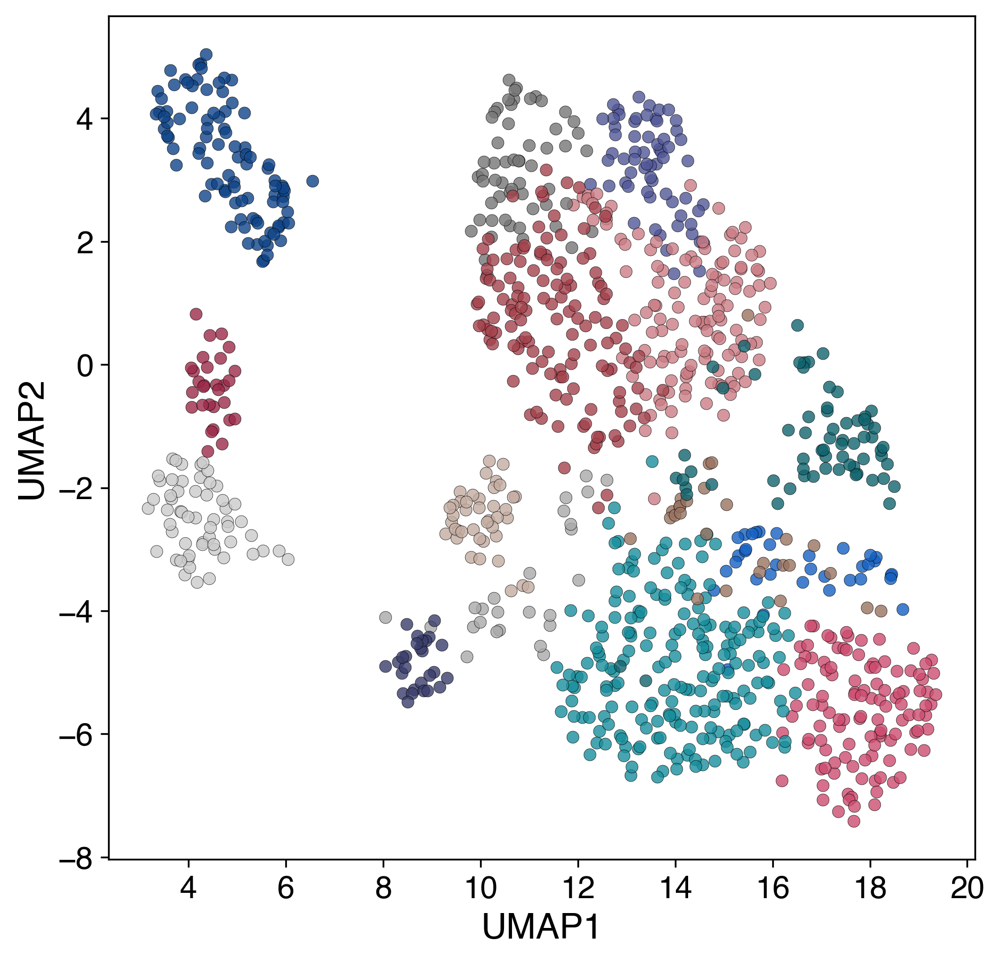

Please note that some colors only differ in the shade due to the large number of clusters.


In [15]:
# draw the clusters
print("Visualization of the clusters:")

# making sure there are enough colors
all_colors = all_colors * 4

plt.figure(figsize=(7,7),dpi=300)
plt.xlabel("UMAP1",fontsize=16)
plt.ylabel("UMAP2",fontsize=16)

for cluster_id in sorted(df_umap['clusters'].unique()):
    color_id = cluster_id-1  # colors are zero-index, but clusters one-indexed
    cluster_data = df_umap[df_umap['clusters'] == cluster_id]
    plt.scatter(
        cluster_data['UMAP1'], cluster_data['UMAP2'],
        color=all_colors[color_id],
        label=f'Cluster {cluster_id}',
        s=30, alpha=0.8, edgecolor='k', linewidth=0.2
    )
plt.show()
print("Please note that some colors only differ in the shade due to the large number of clusters.")

In [16]:
# function to calculate the scope score
def calculate_scope_score(av_conversion,av_selectivity,Vendi_score,bounds):
    scaled_conversion = (av_conversion - bounds["conversion"][1])/(bounds["conversion"][0] - bounds["conversion"][1])
    scaled_selectivity = (av_selectivity - bounds["selectivity"][1])/(bounds["selectivity"][0] - bounds["selectivity"][1])
    scaled_obj = (scaled_conversion + scaled_selectivity)/2  # average the scaled objectives
    scaled_Vendi = (Vendi_score - bounds["vendi"][1])/(bounds["vendi"][0] - bounds["vendi"][1])

    return scaled_obj * scaled_Vendi, scaled_obj

In [17]:
# calculate the center-most point of each cluster and the Vendi score for the resulting samples
scope_results = pd.DataFrame(np.nan,index=["Results"],columns=["Average conversion","Average selectivity","Average mean norm. objective","Vendi score","Scope score"])

cluster_conversions = [] # list to save the conversions
cluster_selectivitys = [] # list to save the selectivitys
df_vendi = df_labelled.copy(deep=True)
df_vendi["obj_scaled"] = "PENDING"  # reset the rate data so that only the selected points will have a rate
for cluster in range(max(df_data["clusters"].unique())):  # loop through all clusters
    cluster = cluster+1  # +1 because the range object is 0-indexed whereas the cluster are 1-indexed
    df_cluster = df_data.loc[df_data["clusters"]== cluster]  # look at the points in the current cluster
    df_cluster = df_cluster.drop(columns=["clusters"])  # drop the cluster column to only keep the features (df_clustering did not contain the rate data)
    centroid = df_cluster.mean().values  # this is the center of the cluster
    distances = cdist(df_cluster,[centroid],metric="cityblock").flatten()  # calculate the distances to the center
    df_cluster["distances"] = distances

    centermost_point = df_cluster[df_cluster["distances"] == df_cluster["distances"].min()].index.item()  # get the center-most point
    conversion_clusterpoint = df_labelled.at[centermost_point,"conversion"]  # get the rate data for the center-most point
    selectivity_clusterpoint = df_labelled.at[centermost_point,"selectivity"]  # get the rate data for the center-most point

    df_vendi.loc[centermost_point,"obj_scaled"] = "1"  # put a label for the vendi score calculation (value is not important)
    cluster_conversions.append(conversion_clusterpoint)  # save the point
    cluster_selectivitys.append(selectivity_clusterpoint)  # save the other objective
av_conversion = sum(cluster_conversions)/len(cluster_conversions)
av_selectivity = sum(cluster_selectivitys)/len(cluster_selectivitys)

scope_results.loc["Results","Average conversion"] = av_conversion
scope_results.loc["Results","Average selectivity"] = av_selectivity
df_vendi.to_csv(wdir.joinpath("df_clustering_vendi.csv"),index=True,header=True)  # save the file (as the Vendi score calculation needs a file as input)
Vendi_score = ScopeBO().get_vendi_score(objectives=["conversion","selectivity","obj_scaled"],directory=".",filename="df_clustering_vendi.csv")  # calculate the vendi score
scope_results.loc["Results","Vendi score"] = Vendi_score
scope_score, scaled_obj = calculate_scope_score(av_conversion,av_selectivity,Vendi_score,bounds)
scope_results.loc["Results","Scope score"] = scope_score
scope_results.loc["Results","Average mean norm. objective"] = scaled_obj

In [18]:
# make an additional column in the labelled dataset with the scaled mean objective
df_labelled["conversion_scaled"] = (df_labelled["conversion"] - bounds["conversion"][1])/(bounds["conversion"][0] - bounds["conversion"][1])
df_labelled["selectivity_scaled"] = (df_labelled["selectivity"] - bounds["selectivity"][1])/(bounds["selectivity"][0] - bounds["selectivity"][1])
df_labelled["obj_scaled"] = (df_labelled["conversion_scaled"] + df_labelled["selectivity_scaled"])/2

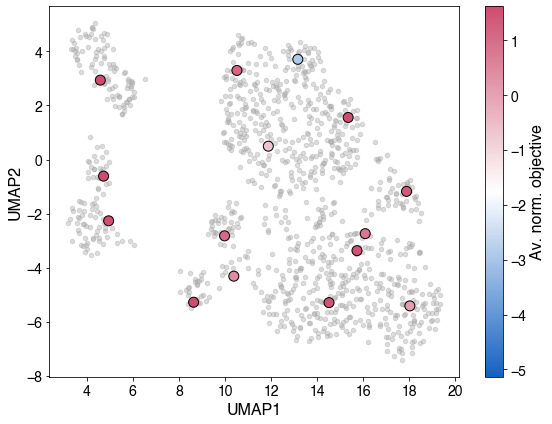

Scope results:


,Average conversion,Average selectivity,Average mean norm. objective,Vendi score,Scope score
Results,91.133333,1.247382,0.817784,2.204747,0.081035


In [19]:
plt.figure(figsize=(8,6))
plt.xlabel("UMAP1",fontsize=16)
plt.ylabel("UMAP2",fontsize=16)

# only keep the objective label for evaluated points
df_umap["obj_scaled"] = df_labelled["obj_scaled"]
df_umap["selectivity"] = df_labelled["selectivity"]
df_umap["conversion"] = df_labelled["conversion"]

for idx in df_vendi.index:
    if df_vendi.loc[idx,"obj_scaled"] == "PENDING":
        df_umap.loc[idx,"obj_scaled"] = "PENDING"
        df_umap.loc[idx,"conversion"] = "PENDING"
        df_umap.loc[idx,"selectivity"] = "PENDING"

# Separate numeric and non-numeric (e.g., "PENDING") entries
df_numeric = df_umap[pd.to_numeric(df_umap['obj_scaled'], errors='coerce').notna()].copy()
df_numeric['obj_scaled'] = df_numeric['obj_scaled'].astype(float)
df_pending = df_umap[pd.to_numeric(df_umap['obj_scaled'], errors='coerce').isna()]

# Define colormap and normalization
vmin = df_labelled['obj_scaled'].min()
vmax = df_labelled['obj_scaled'].max()
norm = plt.Normalize(vmin, vmax)
cmap = sns.color_palette("Doyle_cont", as_cmap=True)

# Plot non-numeric entries ("PENDING")
plt.scatter(df_pending["UMAP1"], df_pending["UMAP2"], color=all_colors[6], s=20, alpha=0.4, label="PENDING")
# Plot numeric entries
scatter_numeric = plt.scatter(df_numeric["UMAP1"],df_numeric["UMAP2"],c=df_numeric["obj_scaled"],cmap=cmap,norm=norm,s=100,alpha=1,edgecolor='k',linewidth=1)
# Add colorbar
cbar = plt.colorbar(scatter_numeric)
cbar.set_label("Av. norm. objective")

plt.tight_layout()
plt.show()
print("Scope results:")
scope_results

In [20]:
print("Normalization bounds for comparison:")
pd.DataFrame.from_dict(bounds)

Normalization bounds for comparison:


,conversion,vendi,selectivity
0,90.634062,5.580807,1.296736
1,74.351563,1.833416,1.171819


In [21]:
print("Average results for ScopeBO:")
_,dfs_raw_data = Benchmark().get_metric_overview(budget=27, type_results= "scope",
                        name_results=f"./Results_Data/scope_balanced_pruning",
                        bounds={"conversion":conversion_bounds,"selectivity":selectivity_bounds,"vendi":vendi_bounds})
df_scopebo = pd.DataFrame(np.mean(np.stack(list(dfs_raw_data["b3_V13"].values())),axis=0),columns=dfs_raw_data["b3_V13"][0].columns)
# make an additional column with the scaled mean objective
df_scopebo["conversion_scaled"] = (df_scopebo["conversion"] - bounds["conversion"][1])/(bounds["conversion"][0] - bounds["conversion"][1])
df_scopebo["selectivity_scaled"] = (df_scopebo["selectivity"] - bounds["selectivity"][1])/(bounds["selectivity"][0] - bounds["selectivity"][1])
df_scopebo["obj_scaled"] = (df_scopebo["conversion_scaled"] + df_scopebo["selectivity_scaled"])/2
df_scopebo.drop(columns=["conversion_scaled","selectivity_scaled"]).iloc[-1]

Average results for ScopeBO:


vendi           4.012187
conversion     81.253241
selectivity     1.235220
scope           0.264368
obj_scaled      0.465706
Name: 8, dtype: float64

Doyle clustering scope (normalized mean objective values):


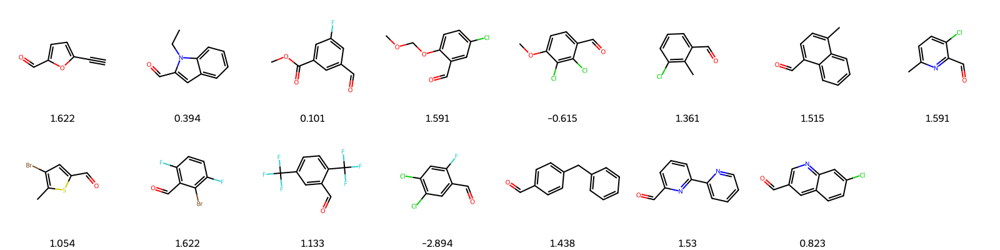

In [22]:
# show the selected molecules
print(f"Doyle clustering scope (normalized mean objective values):")
df_selected = df_umap.loc[df_umap["obj_scaled"] != "PENDING"]
doyle_scope = {idx: df_selected.loc[idx,"obj_scaled"] for idx in df_selected.index}
depiction = Draw.MolsToGridImage(
    [Chem.MolFromSmiles(smi) for smi in doyle_scope.keys()],
    molsPerRow=8,
    subImgSize=(200, 200),
    legends=[f"{round(val,3)}" for val in doyle_scope.values()]
    )
display(depiction)

In [23]:
df_umap.to_csv(f"./Results_Data/Cluster_Scopes/scope_doyle_samples.csv",index=True,header=True)
# save the results for the scopes
scope_results.to_csv(f"./Results_Data/Cluster_Scopes/results_doyle.csv",index=True,header=True)

### Glorius clustering

A scope for the datasets is generated using the clustering approach introduced by Glorius and co-workers (ACS Cent. Sci. 2024, 10, 899-906). As the clustering algorithm is not compatible with smiles of substrate combinations (here: acid chloride + amine), the smiles of the reaction products (amides) are used as input for the algorithm.

In [24]:
# save the substrate names as a txt file (required input for the webapp by Glorius and co-workers)
pd.DataFrame(df_labelled.index.values,index=None,columns=None).to_csv("./Results_Data/Cluster_Scopes/glorius_input.txt",index=False,header=False)

The scope was created using the webapp https://pharmascope.uni-muenster.de/ using the recommended settings (15 clusters using the provided standard UMAP 0_ECFP_2_512_UMAP_2dim_30nb_0.1mindist_jaccard.model). A list of the product SMILES strings of all amides dataset was provided as the input and the top-1 substrate per cluster was requested. As this however only generated 10 samples instead of the expected 15, we increased the number of clusters until 15 samples were generated. This was the case when 24 clusters were requested.

In [25]:
# read in the results
df_clustering = pd.read_csv(f"./Results_Data/Cluster_Scopes/glorius_samples.csv", index_col=0,header=0)
df_clustering.set_index("smiles",inplace=True)
df_clustering.head()

,mol_dist_from_center,mol_id,umap_1,umap_2
smiles,,,,
O=Cc1scc2c1OCCO2,0.417552,66,10.101818,8.278498
CCCCCCc1cc(C=O)sc1Br,0.934960,789,12.949636,5.036352
O=Cc1ncc(C(F)(F)F)cc1F,0.314043,873,13.463346,9.865428
O=Cc1cc2nccc(Cl)c2s1,0.174426,230,13.762393,10.933685
O=Cc1cc(Br)ncc1Cl,0.076848,431,12.290181,11.369546


In [26]:
df_glorius = df_labelled.copy()
# assign the samples (by removing the yields for all non-selected compounds)
df_glorius.loc[~df_glorius.index.isin(df_clustering.index.to_list()),"selectivity"] = "PENDING"
df_glorius.loc[~df_glorius.index.isin(df_clustering.index.to_list()),"conversion"] = "PENDING"
df_glorius.loc[~df_glorius.index.isin(df_clustering.index.to_list()),"obj_scaled"] = "PENDING"

# Safety check
print(f"After removing rate data for all compounds that were not selected, {len(df_glorius[df_glorius['obj_scaled'] != 'PENDING'])}"\
      " samples still have objective data.")

After removing rate data for all compounds that were not selected, 15 samples still have objective data.


Glorius clustering scope (scaled mean normalized objective values):


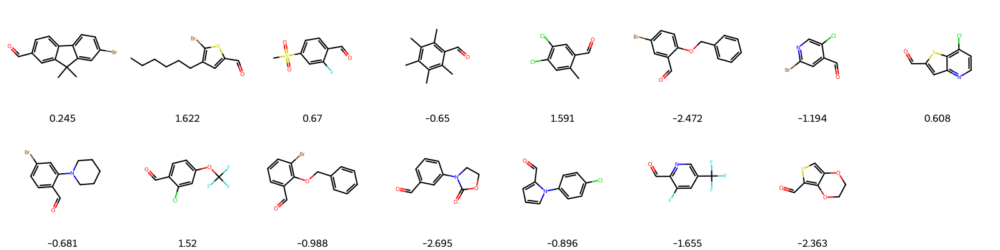

In [27]:
# draw the scope
print(f"Glorius clustering scope (scaled mean normalized objective values):")
df_selected = df_glorius.loc[df_glorius["obj_scaled"] != "PENDING"]
glorius_scope = {idx: df_selected.loc[idx,"obj_scaled"] for idx in df_selected.index}
depiction = Draw.MolsToGridImage(
    [Chem.MolFromSmiles(smi) for smi in glorius_scope.keys()],
    molsPerRow=8,
    subImgSize=(200, 200),
    legends=[f"{round(val,3)}" for val in glorius_scope.values()]
    )
display(depiction)

In [28]:
df_umap.columns

Index(['UMAP1', 'UMAP2', 'clusters', 'obj_scaled', 'selectivity',
       'conversion'],
      dtype='object')

In [29]:
# visualize on a UMAP

df_umap_glorius = df_umap.copy()
 # reset the UMAP df (still had data from Doyle clustering)
df_umap_glorius = df_umap_glorius.drop(columns=["clusters","obj_scaled","selectivity","conversion"])

# assign the samples
df_umap_glorius["selectivity"] = df_glorius["selectivity"]
df_umap_glorius["conversion"] = df_glorius["conversion"]
df_umap_glorius["obj_scaled"] = df_glorius["obj_scaled"]

In [30]:
# calculate av obj_scaled, Vendi score and scope score
scope_results_glorius = pd.DataFrame(np.nan,index=range(1),columns=["Av. Obj_scaled","Vendi score","Scope score", "Av. Selectivity","Av. Conversion"])
for obj in ["Obj_scaled","Selectivity","Conversion"]:
    av_obj_glorius = df_umap_glorius[df_umap_glorius[obj.lower()] != "PENDING"][obj.lower()].mean()
    scope_results_glorius[f"Av. {obj}"] = av_obj_glorius
df_umap_glorius.to_csv("df_vendi.csv",index=True,header=True)
vendi_score_glorius = ScopeBO().get_vendi_score(objectives=["conversion","selectivity","obj_scaled"], filename="df_vendi.csv")
scope_results_glorius["Vendi score"] = vendi_score_glorius
scope_results_glorius["Scope score"], _ = calculate_scope_score(av_conversion = scope_results_glorius.loc[0,"Av. Conversion"],
                                                             av_selectivity = scope_results_glorius.loc[0, "Av. Selectivity"],
                                                             Vendi_score = vendi_score_glorius, bounds = bounds)

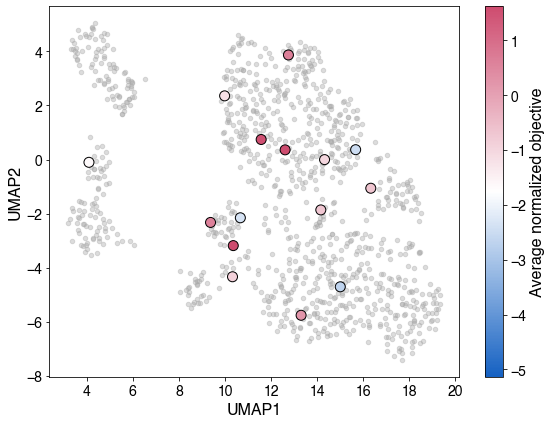

Scope results:


,Av. Obj_scaled,Vendi score,Scope score,Av. Selectivity,Av. Conversion
0,-0.489205,1.458286,0.048972,1.117677,65.477778


In [31]:
plt.figure(figsize=(8,6))
plt.xlabel("UMAP1",fontsize=16)
plt.ylabel("UMAP2",fontsize=16)

# Separate numeric and non-numeric (e.g., "PENDING") entries
df_numeric = df_umap_glorius[pd.to_numeric(df_umap_glorius['obj_scaled'], errors='coerce').notna()].copy()
df_numeric['obj_scaled'] = df_numeric['obj_scaled'].astype(float)
df_pending = df_umap_glorius[pd.to_numeric(df_umap_glorius['obj_scaled'], errors='coerce').isna()]

# Define colormap and normalization
vmin = df_labelled['obj_scaled'].min()
vmax = df_labelled['obj_scaled'].max()
norm = plt.Normalize(vmin, vmax)
cmap = sns.color_palette("Doyle_cont", as_cmap=True)

# Plot non-numeric entries ("PENDING")
plt.scatter(df_pending["UMAP1"], df_pending["UMAP2"], color=all_colors[6], s=20, alpha=0.4, label="PENDING")
# Plot numeric entries
scatter_numeric = plt.scatter(df_numeric["UMAP1"],df_numeric["UMAP2"],c=df_numeric["obj_scaled"],
                              cmap=cmap,norm=norm,s=100,alpha=1,edgecolor='k',linewidth=1)
# Add colorbar
cbar = plt.colorbar(scatter_numeric)
cbar.set_label("Average normalized objective")

plt.tight_layout()
plt.show()
print("Scope results:")
scope_results_glorius

In [32]:
bounds

{'conversion': (90.6340625, 74.35156250000003),
 'vendi': (5.580807145374729, 1.833416342650975),
 'selectivity': (1.2967363036066584, 1.1718187970018277)}

The scope score for the Glorius clustering is positive because both the average normalized objective and Vendi score are negative (values are below the normalization bounds). As the score is therefore misleading, we re-assigned it manually as 0.

In [33]:
scope_results_glorius["Scope score"] = 0
scope_results_glorius

,Av. Obj_scaled,Vendi score,Scope score,Av. Selectivity,Av. Conversion
0,-0.489205,1.458286,0,1.117677,65.477778


### Benchmark comparisons

Collect the data

In [34]:
acq_fct = ["EI","Random","Greedy","Conv. selection","Explorative"]
pruning_opt = [False,True]

map_data = {}
std_data = {}
for acq in acq_fct:
    if acq.lower() == "ei":
        acq_label = "balanced"
    elif acq == "Conv. selection":
        acq_label =  "human-like-acq"
    else:
        acq_label = acq.lower()
    for pruning in [True,False]:
        if pruning:
            pruning_label = "_pruning"
        else:
            pruning_label = "_no-pruning"
        if acq == "Conv. selection":
            pruning_label = ""
        run_results = []
        std_results = []
        types = ["Selectivity","Conversion","Objective","Vendi","Scope"]
        for type_results in types:
            dfs_scaled,_ = Benchmark.get_metric_overview(budget=27,type_results=type_results,
                                            name_results=f"Results_Data/scope_{acq_label}{pruning_label}",
                                            scope_method="product",
                                            bounds = bounds, directory=".")
            run_results.append(dfs_scaled["means"].iloc[-1,0])  # save the last mean which is the result at the end of the scope
            std_results.append(dfs_scaled["stdev"].iloc[-1,0])  # same for the standard deviation of the result
        map_data[f"{acq}{pruning_label}"] = run_results
        std_data[f"{acq}{pruning_label}"] = std_results
map_df = pd.DataFrame.from_dict(map_data)
map_df.index = types
std_df = pd.DataFrame.from_dict(std_data)
std_df.index = types

# add clustering data
map_df["Doyle_clustering"] = [scope_results.loc["Results","Average selectivity"],
                              scope_results.loc["Results","Average conversion"],
                              scope_results.loc["Results","Average mean norm. objective"],
                              scope_results.loc["Results","Vendi score"],
                              scope_results.loc["Results","Scope score"]]
map_df["Glorius_clustering"] = [scope_results_glorius.loc[0,"Av. Selectivity"],
                              scope_results_glorius.loc[0,"Av. Conversion"],
                              scope_results_glorius.loc[0,"Av. Obj_scaled"],
                              scope_results_glorius.loc[0,"Vendi score"],
                              scope_results_glorius.loc[0,"Scope score"]]
std_df["Doyle_clustering"] = [0,0,0,0,0]  # no std as only one deterministic run
std_df["Glorius_clustering"] = [0,0,0,0,0]  # no std as only one deterministic run

In [35]:
# simplify the labels
labels = map_df.columns
labels = list(labels)
for i,val in enumerate(labels):
    if val == "EI_pruning":
        labels[i] = "ScopeBO"
    elif "no-pruning" in val:
        labels[i] = val.split("_")[0]
    elif "_pruning" in val:
        labels[i] = val.split("_")[0] + " (pruned)"
map_df.columns = labels
std_df.columns = labels

In [36]:
# calculate the average rate and Vendi score across the whole dataset

full_av_obj = df_labelled["obj_scaled"].mean()
full_av_sel = df_labelled["selectivity"].mean()
full_av_conv = df_labelled["conversion"].mean()

full_vendi_score = ScopeBO().get_vendi_score(objectives=["selectivity","conversion"],filename="./cho_dset.csv")
print("Average normalized objective across the entire dataset:", full_av_obj)
print("Average selectivity across the entire dataset:", full_av_sel)
print("Average conversion across the entire dataset:", full_av_conv)
print("Vendi score across the entire dataset:", full_vendi_score)

Average normalized objective across the entire dataset: 0.8056987714498031
Average selectivity across the entire dataset: 1.2653499922957028
Average conversion across the entire dataset: 88.39772380079437
Vendi score across the entire dataset: 2.545718262127056


Visualize the results

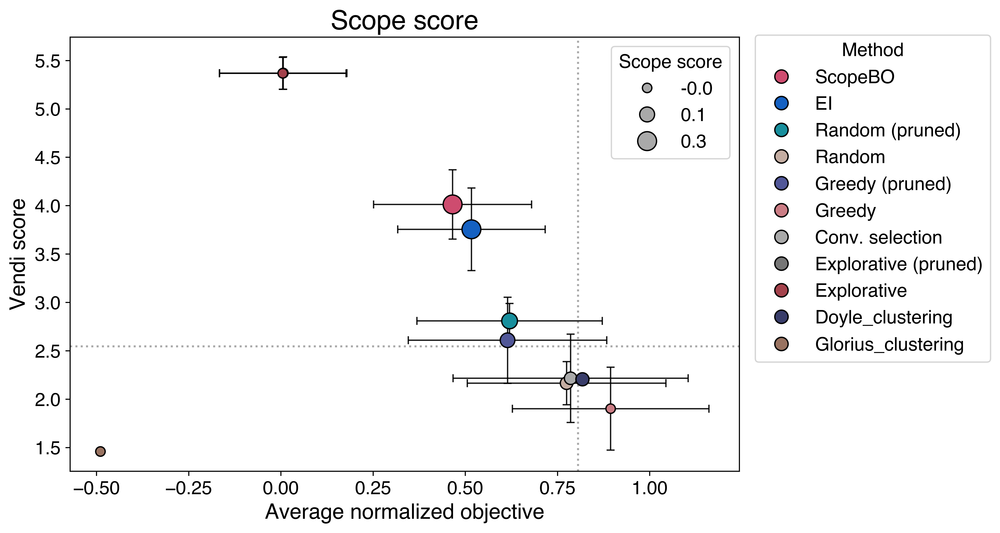

,Selectivity,Conversion,Objective,Vendi,Scope
ScopeBO,1.235 ± 0.038,81.253 ± 4.145,0.466 ± 0.214,4.012 ± 0.358,0.264 ± 0.119
EI,1.243 ± 0.041,81.899 ± 3.289,0.517 ± 0.2,3.755 ± 0.427,0.263 ± 0.113
Random (pruned),1.245 ± 0.049,84.946 ± 3.78,0.62 ± 0.251,2.808 ± 0.181,0.157 ± 0.061
Random,1.263 ± 0.055,87.689 ± 4.37,0.775 ± 0.269,2.165 ± 0.222,0.066 ± 0.047
Greedy (pruned),1.244 ± 0.049,84.918 ± 5.657,0.615 ± 0.269,2.608 ± 0.445,0.123 ± 0.089
Greedy,1.279 ± 0.039,89.516 ± 5.893,0.894 ± 0.266,1.901 ± 0.428,-0.001 ± 0.086
Conv. selection,1.269 ± 0.053,87.272 ± 5.417,0.786 ± 0.319,2.215 ± 0.457,0.065 ± 0.085
Explorative (pruned),1.181 ± 0.029,73.31 ± 3.082,0.006 ± 0.172,5.37 ± 0.168,0.004 ± 0.163
Explorative,1.181 ± 0.028,73.286 ± 3.094,0.005 ± 0.172,5.368 ± 0.165,0.003 ± 0.162
Doyle_clustering,1.247 ± 0,91.133 ± 0,0.818 ± 0,2.205 ± 0,0.081 ± 0


NOTE: the scope score for the Glorius clustering was manually set to 0 as the low metric values incorrectly
provided a positive score (negative * negative = positive).


In [38]:
# Plot the results
x = map_df.loc["Objective"]
y = map_df.loc["Vendi"]
xerr = std_df.loc["Objective"]
yerr = std_df.loc["Vendi"]
raw_size_data = map_df.loc["Scope"]

size_min, size_max = 50, 200
data_min, data_max= raw_size_data.min(), raw_size_data.max()
sizes = size_min + (raw_size_data - data_min) * (size_max - size_min) / (data_max - data_min)

# simplify the labels for the legend
labels = map_df.columns
labels = list(labels)
for i,val in enumerate(labels):
    if val == "EI_pruning":
        labels[i] = "ScopeBO"
    elif "no-pruning" in val:
        labels[i] = val.split("_")[0]
    elif "_pruning" in val:
        labels[i] = val.split("_")[0] + " (pruned)"
map_df.columns = labels


color_map = {label: all_colors[i] for i, label in enumerate(labels)}
colors = [color_map[label] for label in labels]
alpha_val = 1

plt.figure(figsize=(9,6),dpi=600)
plt.title(f"Performance map")
plt.scatter(x, y, s=sizes, alpha=alpha_val, c = colors, edgecolors="k", zorder=2)
# Add error bars
plt.errorbar(
    x, y,
    xerr=xerr,
    yerr=yerr,
    fmt='none',
    ecolor='black',
    elinewidth=1,
    capsize=3,
    alpha=0.9,
    zorder=1
)

# lines for the full dataset metrics
plt.axhline(y=full_vendi_score, color=all_colors[6], linestyle=':', linewidth=1.5, zorder=0)
plt.axvline(x=full_av_obj, color=all_colors[6], linestyle=':', linewidth=1.5, zorder=0)


plt.xlabel('Average normalized objective')
plt.ylabel('Vendi score')
plt.title('Scope score')

# legend for the methods
color_legend = [
    Line2D(
        [0], [0],
        marker='o',
        color='w',
        label=label,
        markerfacecolor=color_map[label],
        alpha=alpha_val,
        markeredgecolor='k',
        markersize=10
    )
    for label in labels
]

# legend for scope score
# Choose representative raw size values
size_legend_values = np.linspace(raw_size_data.min(), raw_size_data.max(), 3)
size_legend_sizes = size_min + (size_legend_values - data_min) * (size_max - size_min) / (data_max - data_min)
size_legend = [
    Line2D(
        [0], [0],
        marker='o',
        color='w',
        label=f'{val:.1f}',
        markerfacecolor=all_colors[6],
        alpha=alpha_val,
        markeredgecolor='k',
        markersize=np.sqrt(s)
    )
    for val, s in zip(size_legend_values, size_legend_sizes)
]

# Add legends
first_legend = plt.legend(handles=color_legend, loc = "lower left", title="Method", frameon=True,
                          bbox_to_anchor=(1.01, 0.23))
plt.gca().add_artist(first_legend)
second_legend = plt.legend(handles=size_legend, title="Scope score", frameon=True)

plt.show()
mean_std_df = map_df.applymap(lambda x: str(round(x,3))) + " ± " + std_df.applymap(lambda x: str(round(x,3)))
display(mean_std_df.T)
print("NOTE: the scope score for the Glorius clustering was manually set to 0 as the"\
      " low metric values incorrectly\nprovided a positive score (negative * negative = positive).")

### Statistical testing

To test for statistically significant differences between the selection methods, we carried out a Friedman test for each dataset to test if the scope scores are similar between the methods.

Note that we can not carry out these tests for clustering-based methods as they are deterministic and do not provide a distribution of scope score results.

In [38]:
# read in the data
scope_scores = None
vendi_scores = None
av_yields = None
renaming = {"Greedy_no-pruning":"Greedy",
            "Greedy_pruning":"Greedy (pruned)",
            "EI_no-pruning":"EI",
            "EI_pruning":"ScopeBO",
            "Explorative_pruning":"Explorative (pruned)",
            "Explorative_no-pruning":"Explorative",
            "Random_no-pruning":"Random",
            "Random_pruning":"Random (pruned)",
            "Conv. selection":"Conv. selection"}

for score_type in ["scope","vendi"]:
    scores = pd.DataFrame(np.nan, index=list(renaming.values()), columns=list(range(40)))
    for acq in ["EI","Random","Greedy","Explorative","Conv. selection"]:
        if acq.lower() == "ei":
            acq_label = "balanced"
        elif acq.lower() == "conv. selection":
            acq_label = "human-like-acq"
        else:
            acq_label = acq.lower()
        for pruning in [True,False]:
            if acq.lower() == "conv. selection" and pruning:
                continue  # only read the human-like acq once (no pruning distinction)
            if pruning:
                pruning_label = "_pruning"
            else:
                pruning_label = "_no-pruning"
            if acq.lower() == "conv. selection":
                pruning_label = ""
            _, dict_data = Benchmark().get_metric_overview(bounds = bounds, budget = 27,
                                                name_results=f"Results_Data/scope_{acq_label}{pruning_label}", 
                                                type_results=score_type)
            for seed_dict in dict_data.values():
                for seed, df in seed_dict.items():
                    scores.loc[renaming[acq+pruning_label], seed] = df.loc[8,score_type]
    if score_type == "scope":
        scope_scores = scores.copy()
    elif score_type == "vendi":
        vendi_scores = scores.copy()

In [39]:
from scipy.stats import friedmanchisquare
print("Friedman test results for Scope scores:\n")
res = friedmanchisquare(*scope_scores.values)
print("Friedman statistic:", res.statistic, "\np-value:", res.pvalue)

Friedman test results for Scope scores:

Friedman statistic: 174.20935598909176 
p-value: 1.6901830234582707e-33


In [40]:
print("Friedman test results for Vendi scores:\n")
res = friedmanchisquare(*vendi_scores.values)
print("Friedman statistic:", res.statistic, "\np-value:", res.pvalue)

Friedman test results for Vendi scores:

Friedman statistic: 302.3112791430372 
p-value: 1.3265061155757623e-60


Differences between the selection methods were found (null hypothesis rejected as p < 5%) for all metrics. Thus, we continue with two-sided Wilcoxon tests between ScopeBO and the other methods, controlling for the initiation seed, while correcting for multiple comparisons with the Holm-Bonferroni method.

In [41]:
from scipy.stats import wilcoxon
from statsmodels.stats.multitest import multipletests

def wilcoxon_tests(df):
    """
    Function for performing pairwise Wilcoxon signed-rank tests 
    comparing ScopeBO to each other method, with Holm-Bonferroni correction.
    """
    methods = df.index.tolist()
    reference = methods[3]  # ScopeBo is the 4th method in index of the df

    comparisons = []
    p_values = []

    for method in methods:
        if method == reference:
            continue
        
        # Two-sided Wilcoxon of ScopeBo versus the other method
        stat, p = wilcoxon(
            df.loc[reference],
            df.loc[method],
            alternative= "two-sided"
        )
        
        comparisons.append(method)
        p_values.append(p)

    # Holm-Bonferroni correction
    reject, pvals_corrected, _, _ = multipletests(
        p_values,
        alpha=0.05,
        method='holm'
    )
    print(comparisons)
    results = pd.DataFrame({
        "Comparison": comparisons,
        "Corrected p-value": pvals_corrected,
        "ScopeBO higher?": [np.mean(df.loc[reference].values) > np.mean(df.loc[comp].mean()) for comp in comparisons],
        "Different?": reject,
    })

    print(f"Reference method: {reference}")
    display(results)

In [42]:
print("Two-sided Wilcoxon signed-rank tests comparing ScopeBO to other methods (Scope score):\n")
wilcoxon_tests(scope_scores)

Two-sided Wilcoxon signed-rank tests comparing ScopeBO to other methods (Scope score):

['Greedy', 'Greedy (pruned)', 'EI', 'Explorative (pruned)', 'Explorative', 'Random', 'Random (pruned)', 'Conv. selection']
Reference method: ScopeBO


,Comparison,Corrected p-value,ScopeBO higher?,Different?
0,Greedy,1.018634e-10,True,True
1,Greedy (pruned),2.141232e-06,True,True
2,EI,9.100460e-01,True,False
3,Explorative (pruned),1.897934e-08,True,True
4,Explorative,1.897934e-08,True,True
5,Random,1.897934e-08,True,True
6,Random (pruned),6.389258e-06,True,True
7,Conv. selection,9.702489e-09,True,True


In [43]:
print("Two-sided Wilcoxon signed-rank tests comparing ScopeBO to other methods (vendi score):\n")
wilcoxon_tests(vendi_scores)

Two-sided Wilcoxon signed-rank tests comparing ScopeBO to other methods (vendi score):

['Greedy', 'Greedy (pruned)', 'EI', 'Explorative (pruned)', 'Explorative', 'Random', 'Random (pruned)', 'Conv. selection']
Reference method: ScopeBO


,Comparison,Corrected p-value,ScopeBO higher?,Different?
0,Greedy,1.455192e-11,True,True
1,Greedy (pruned),1.455192e-11,True,True
2,EI,7.508137e-06,True,True
3,Explorative (pruned),1.455192e-11,False,True
4,Explorative,1.455192e-11,False,True
5,Random,1.455192e-11,True,True
6,Random (pruned),1.455192e-11,True,True
7,Conv. selection,1.455192e-11,True,True


### Validation of the high performance initiation strategy

We can now evaluate the scope initiation strategy of selecting high-performing samples in the first round. This strategy was establisehd with the ArI dataset.

In [44]:
# get the data for the different random initiations

# get the data for the inidividual seeds
_, dict_raw_data = Benchmark.get_metric_overview(bounds=bounds,budget=27,type_results="scope", 
                            name_results=f"./Results_Data/scope_balanced_pruning")
# dfs_raw_data[dset] contains a dict for all batch-pruning combination with another dict as 
# the value which contains the data for the random seeds
# here, we only have one combination (b3_V13 --> optimized hyperparameters)
# --> reassign dfs_raw_data[dset] for simplier handling
dfs_raw_data = dict_raw_data["b3_V13"]

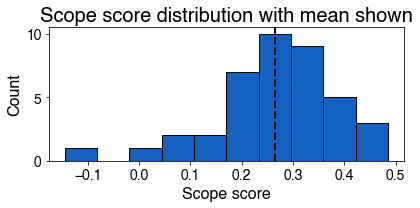

In [45]:
# get and plot the final scope scores for the inidividual seeds
nr_seeds = len(dfs_raw_data)
score_list = [dfs_raw_data[i].loc[8,"scope"] for i in range(nr_seeds)]
mean_score = np.mean(score_list)  # mean scope score

plt.figure(figsize=(6,3))
plt.title("Scope score distribution with mean shown")
plt.xlabel("Scope score")
plt.hist(score_list, color=all_colors[1], bins=10, edgecolor="k")
plt.axvline(x=mean_score, color='black', linestyle='--', linewidth=2)
plt.ylabel("Count")
plt.tight_layout()
plt.show()


In [46]:
# check: How are the final scope scores when the initiations with the highest initial average rates are regarded?
summ_top_obj = pd.DataFrame(np.nan,index=["Top5 initial av. obj", "random initiation"],
                             columns=["Mean final scope score",
                                      "Worst final scope score",
                                      "Mean initial average obj"])

In [47]:
initial_vendi = [dfs_raw_data[i].loc[0,"vendi"] for i in range(nr_seeds)]
initial_sel = [dfs_raw_data[i].loc[0,"selectivity"] for i in range(nr_seeds)]
initial_con = [dfs_raw_data[i].loc[0,"conversion"] for i in range(nr_seeds)]
initial_obj = [calculate_scope_score(av_conversion = initial_con[i], 
                                     av_selectivity = initial_sel[i], 
                                     Vendi_score = initial_vendi[i], 
                                     bounds =bounds
                                     )[1]  # second output of the function is the mean norm. obj.
                                     for i in range(len(initial_vendi))]


summ_top_obj.loc["random initiation","Mean initial average obj"] = round(np.mean(initial_obj),3)
summ_top_obj.loc["random initiation","Mean final scope score"] = round(np.mean(np.array(score_list)),3)
summ_top_obj.loc["random initiation","Worst final scope score"] = round(np.min(np.array(score_list)),3)


# get the seeds that have the top 5 initial average rates
indexed_obj = list(enumerate(initial_obj))  # generate (index,av. obj) tuples
top_5 = sorted(indexed_obj, key=lambda x: x[1], reverse=True)[:5]  # sort by score
best_seeds = [index for index, obj_val in top_5]
print(f"Top 5 seeds by initial average obj:", best_seeds)

# get the averages of the final samples for the top 5 seeds
best_init_final_scope = [dfs_raw_data[i].loc[8,"scope"] for i in best_seeds]
best_init_obj = [initial_obj[i] for i in best_seeds]

summ_top_obj.loc["Top5 initial av. obj","Mean final scope score"] = round(np.mean(best_init_final_scope),3)
summ_top_obj.loc["Top5 initial av. obj","Worst final scope score"] = round(np.min(best_init_final_scope),3)
summ_top_obj.loc["Top5 initial av. obj","Mean initial average obj"] = round(np.mean(best_init_obj),3)

summ_top_obj

Top 5 seeds by initial average obj: [0, 9, 12, 23, 15]


,Mean final scope score,Worst final scope score,Mean initial average obj
Top5 initial av. obj,0.343,0.302,1.573
random initiation,0.264,-0.145,0.617


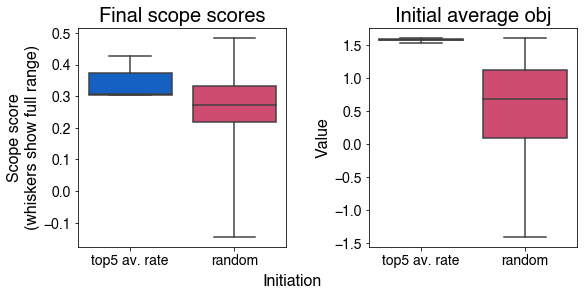

In [48]:
fig, axes = plt.subplots(1,2, figsize = (8,4),gridspec_kw={"wspace": 0.1},constrained_layout=True)
for i, results_type in enumerate(["scope","obj"]):
    ax = axes[i]
    if results_type == "scope":
        ax.set_title("Final scope scores")
    else:
        ax.set_title("Initial average obj")
    fig.supxlabel("Initiation",fontsize=16)
    if results_type == "scope":
        df = pd.DataFrame([best_init_final_scope,score_list])
    else:
        df = pd.DataFrame([best_init_obj,initial_obj])
    df_long = df.T.melt(var_name='Row', value_name='Value')
    df_long.loc[df_long["Row"] == 0,"Row"] = "top5 av. rate"
    df_long.loc[df_long["Row"] == 1,"Row"] = "random"
    palette = [all_colors[1], all_colors[0]]
    sns.boxplot(ax=ax,x='Row', y='Value', data=df_long, whis=[0,100], palette=palette, saturation=1)
    if results_type == "scope":
        ax.set_ylabel('Scope score\n(whiskers show full range)')
    elif results_type == "yield":
        ax.set_ylabel("Average rate (%)\n(whiskers show full range)")
    ax.set_xlabel("")
plt.show()

### Visualization of scope examples

Show the scopes for the random seed that provides a scope performance closest to the average of all random seeds (for ScopeBO scopes). Scopes for other methods are shown with the same random seed.

In [6]:
def find_av_random_seed(name_results, bounds, batch_pruning, budget=27):
    """Finds the random seed that give the scope with a scope score closet to the average performance."""

    _, dict_dfs_raw_data = Benchmark.get_metric_overview(bounds=bounds,budget=budget,type_results="scope", 
                                name_results=name_results)

    # dict_dfs_raw_data contains the a dict for each batch-pruning 
    # combination which in turn contains a dict of the raw data for the differnt random seeds
    # --> restrict to the relevant data (batch size 2 and no Vendi pruning)
    dfs_raw_data = dict_dfs_raw_data[batch_pruning]

    # collect the scope scores
    # NOTE: the indices are the (zero-indexed) rounds --> round 8 is the full scope of 27 samples
    score_dict = {seed: df.loc[8,"scope"] for seed,df in dfs_raw_data.items()}
    av_score = np.mean(np.array(list(score_dict.values())))

    # calculate the absolute difference to the average score
    score_diff = {seed: abs(score-av_score) for seed,score in score_dict.items()}

    # get the seed that is closest to the average
    av_seed = min(score_diff,key=score_diff.get)

    return av_seed


def get_umap(name_results, objective, hyperpar="balanced_b3_V13", bounds = bounds, seed = None,figsize=(2.7,2.7), show_colorbar=False):

    if seed is None:
        seed = find_av_random_seed(name_results= name_results, bounds=bounds, batch_pruning= "_".join(hyperpar.split("_")[1:]))
    print("Depicted seed:",seed)
    data_labelled = pd.read_csv(f"./cho_dset.csv",index_col=0)
    obj_max = data_labelled[objective].max()
    obj_min = data_labelled[objective].min()
    Benchmark().track_samples(filename_umap=f"./cho_UMAP_coords.csv",
                            filename_data=f"27{hyperpar}_s{seed}.csv",
                            bounds=bounds,
                            hide_axis = True, obj_plot_bounds=(obj_max,obj_min),
                            filename_labelled=f"./cho_dset.csv",
                            name_results= name_results+ "/raw_data", show_colorbar= show_colorbar,
                            label_round=False, display_cut_samples=False, figsize = figsize, size_scaling = 0.3, dpi=600, obj_to_display=objective)
    
    return seed

UMAPs for ScopeBO:

UMAP for the objective conversion
Depicted seed: 27
Scope score: 0.264
Average objective (scaled on [0,1]-scale): 0.378
Average conversion: 73.988
Average selectivity: 1.269
Vendi score: 4.447


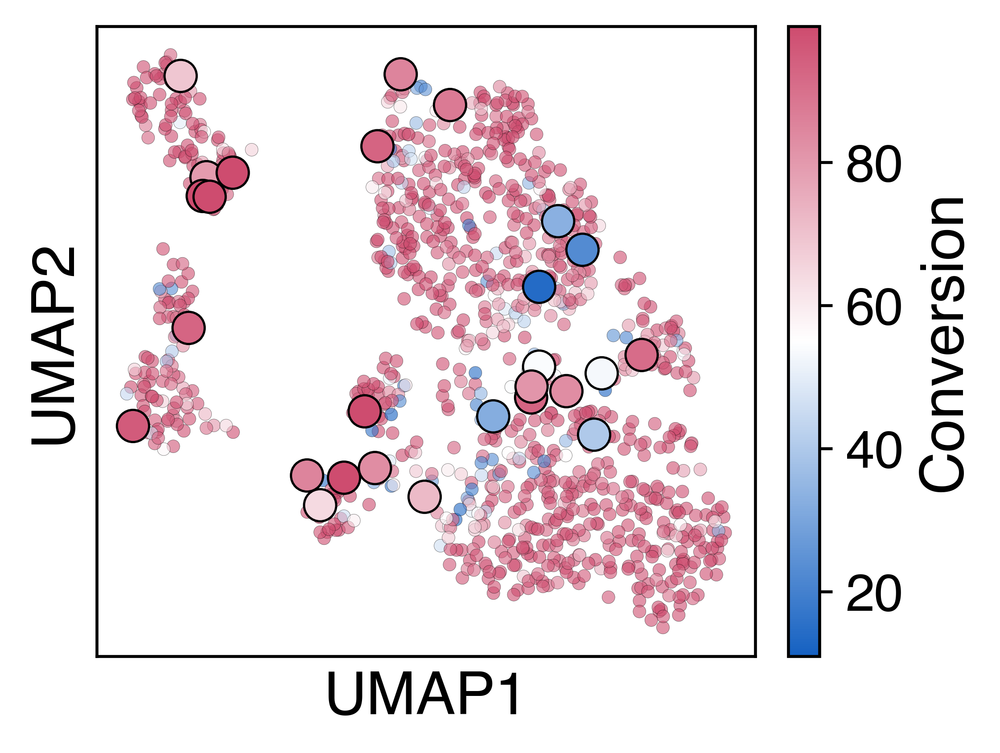

UMAP for the objective selectivity
Depicted seed: 27
Scope score: 0.264
Average objective (scaled on [0,1]-scale): 0.378
Average conversion: 73.988
Average selectivity: 1.269
Vendi score: 4.447


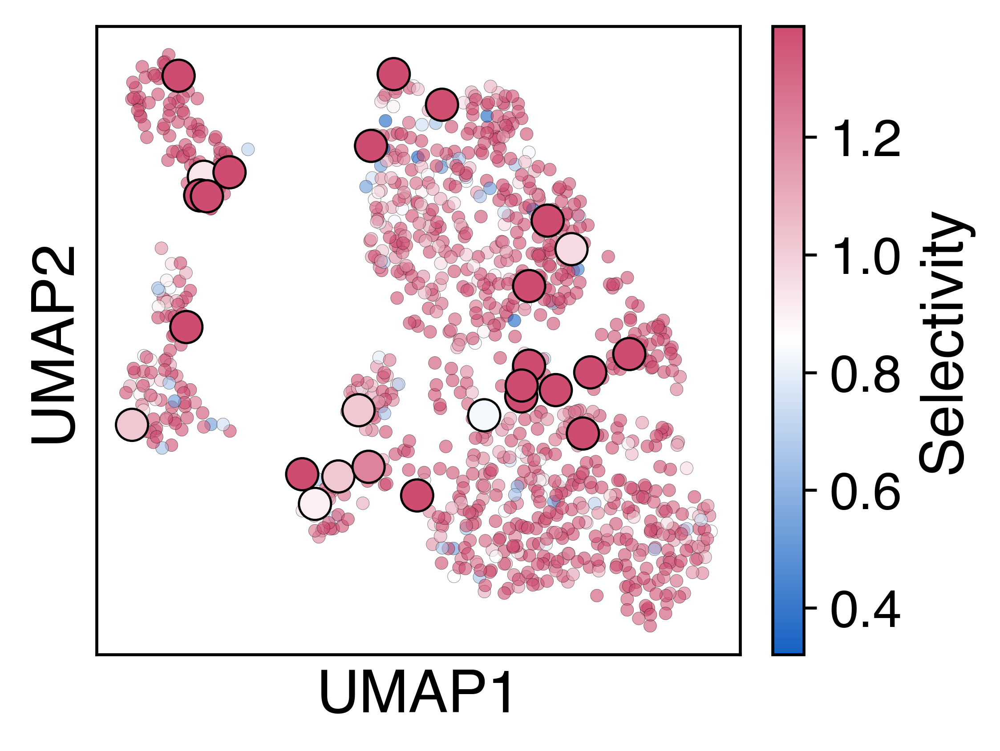

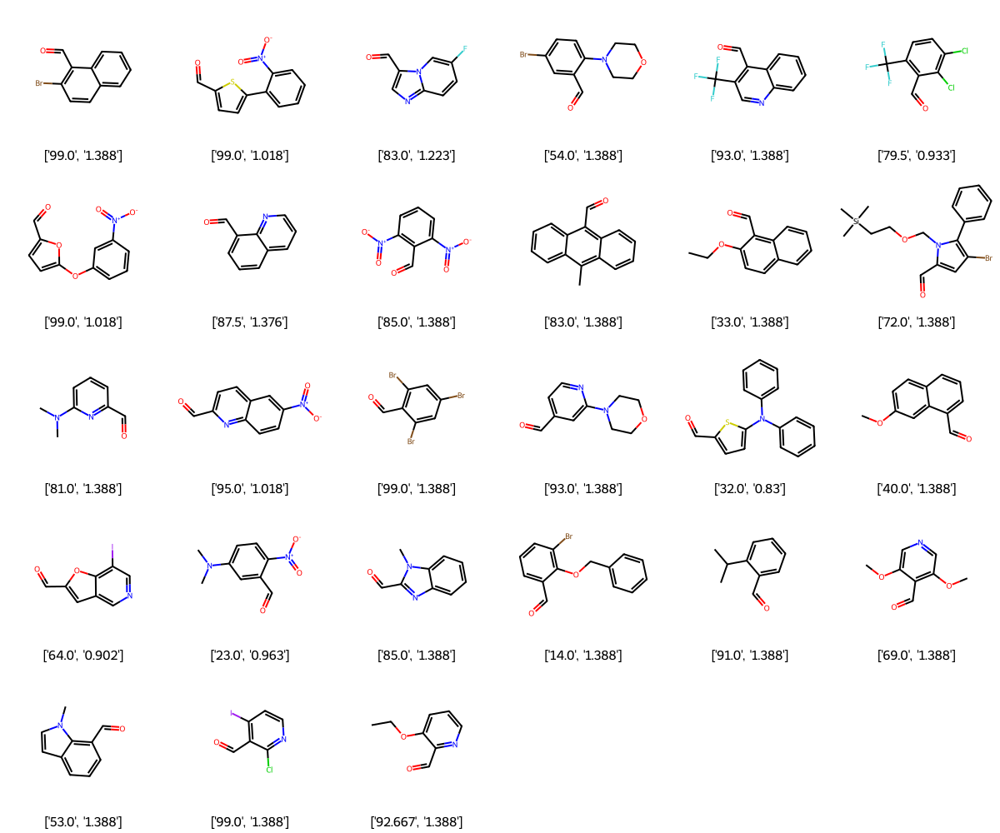

UMAPs for Regular BO (EI):

UMAP for the objective conversion
Depicted seed: 27
Scope score: 0.261
Average objective (scaled on [0,1]-scale): 0.450
Average conversion: 79.444
Average selectivity: 1.245
Vendi score: 4.006


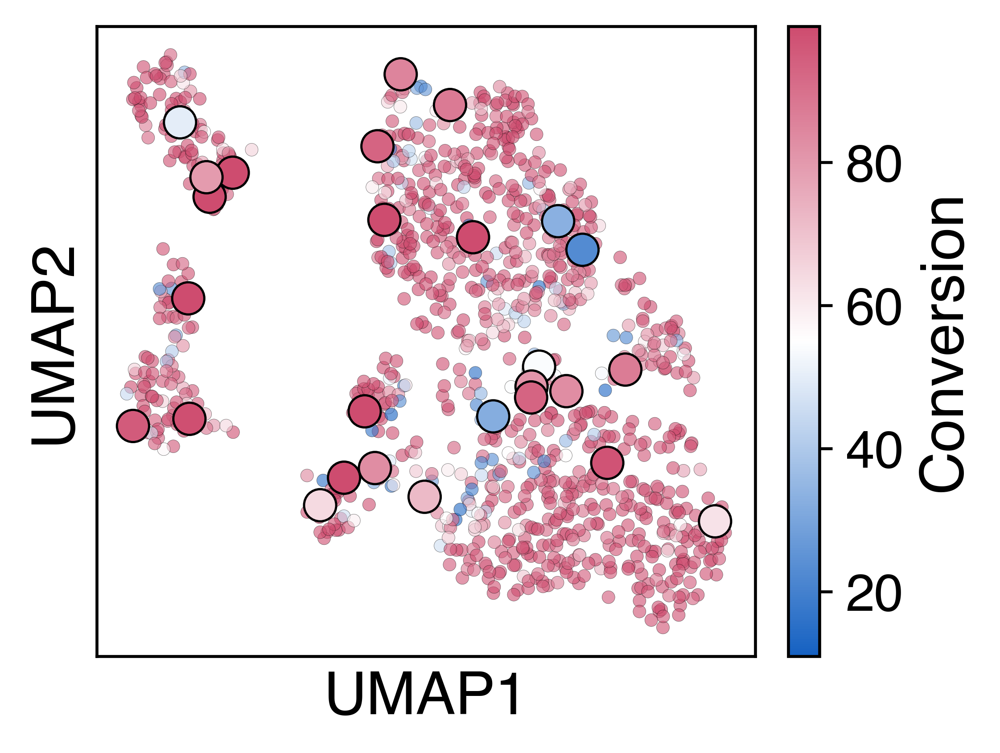

UMAP for the objective selectivity
Depicted seed: 27
Scope score: 0.261
Average objective (scaled on [0,1]-scale): 0.450
Average conversion: 79.444
Average selectivity: 1.245
Vendi score: 4.006


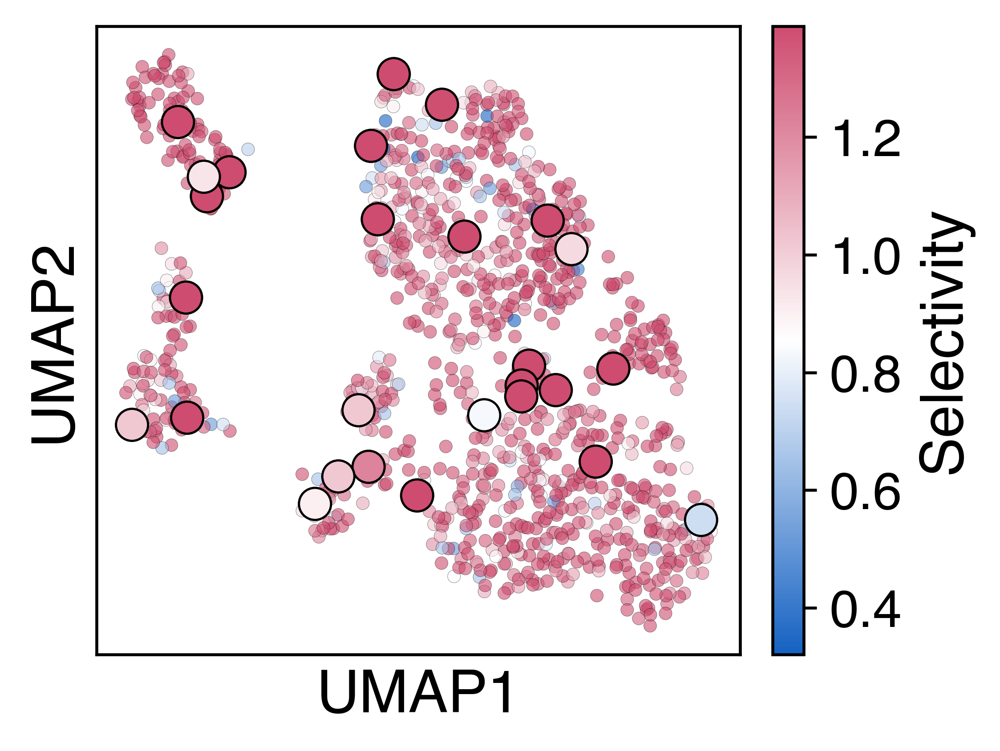

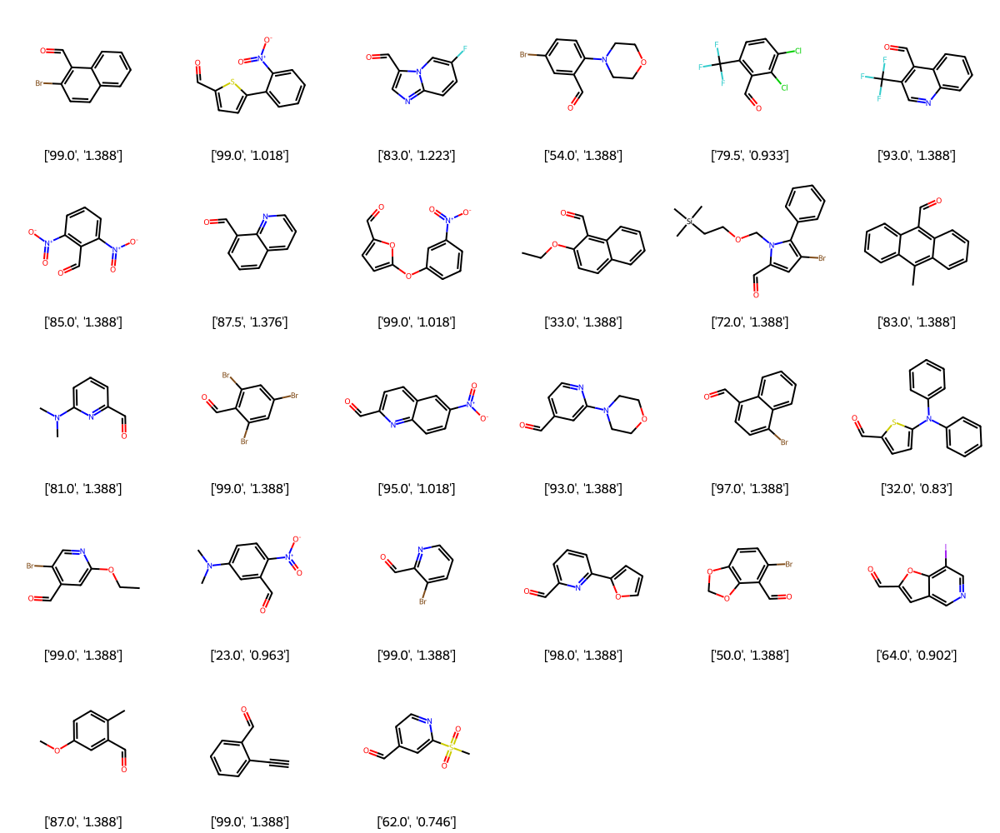

UMAPs for conventional selection:

UMAP for the objective conversion
Depicted seed: 27
Scope score: 0.194
Average objective (scaled on [0,1]-scale): 0.907
Average conversion: 89.093
Average selectivity: 1.285
Vendi score: 2.634


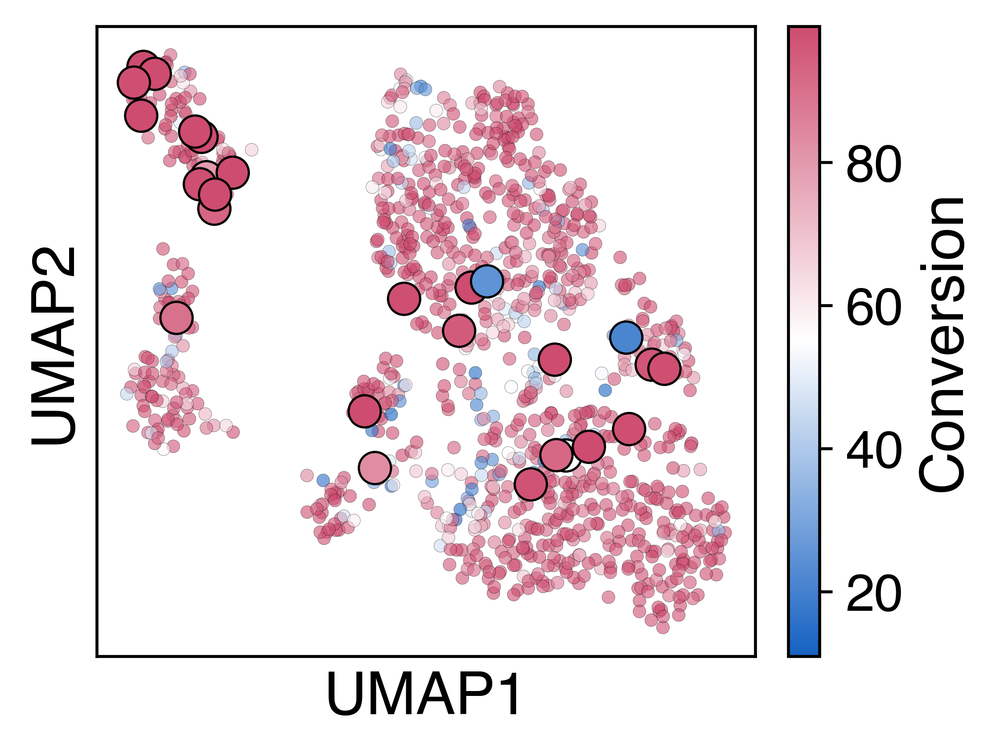

UMAP for the objective selectivity
Depicted seed: 27
Scope score: 0.194
Average objective (scaled on [0,1]-scale): 0.907
Average conversion: 89.093
Average selectivity: 1.285
Vendi score: 2.634


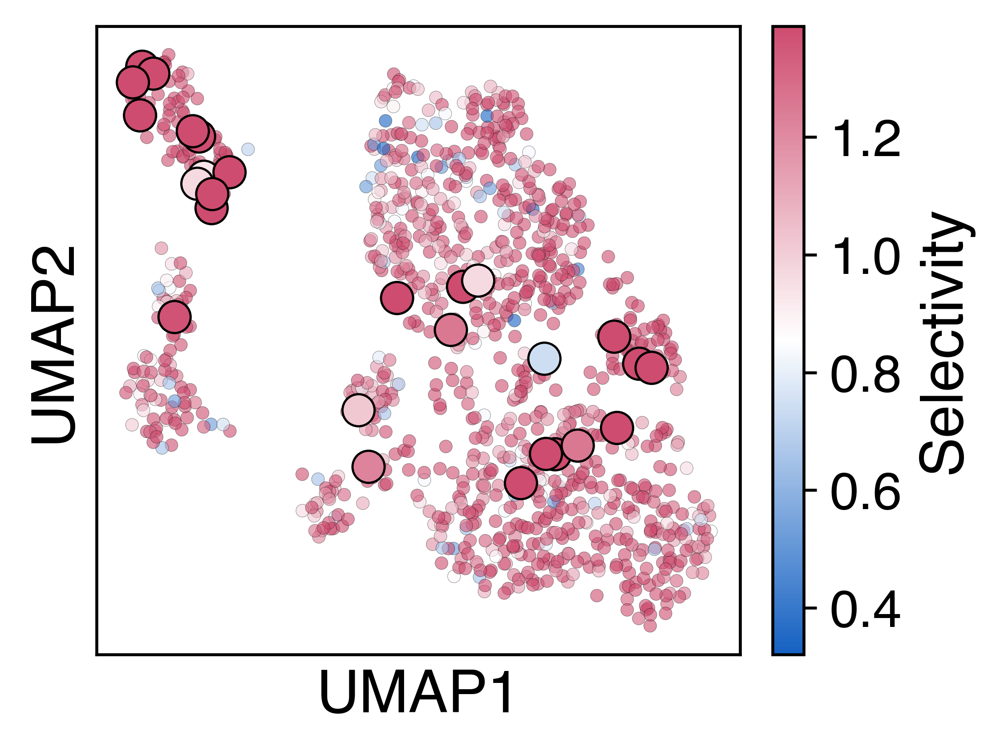

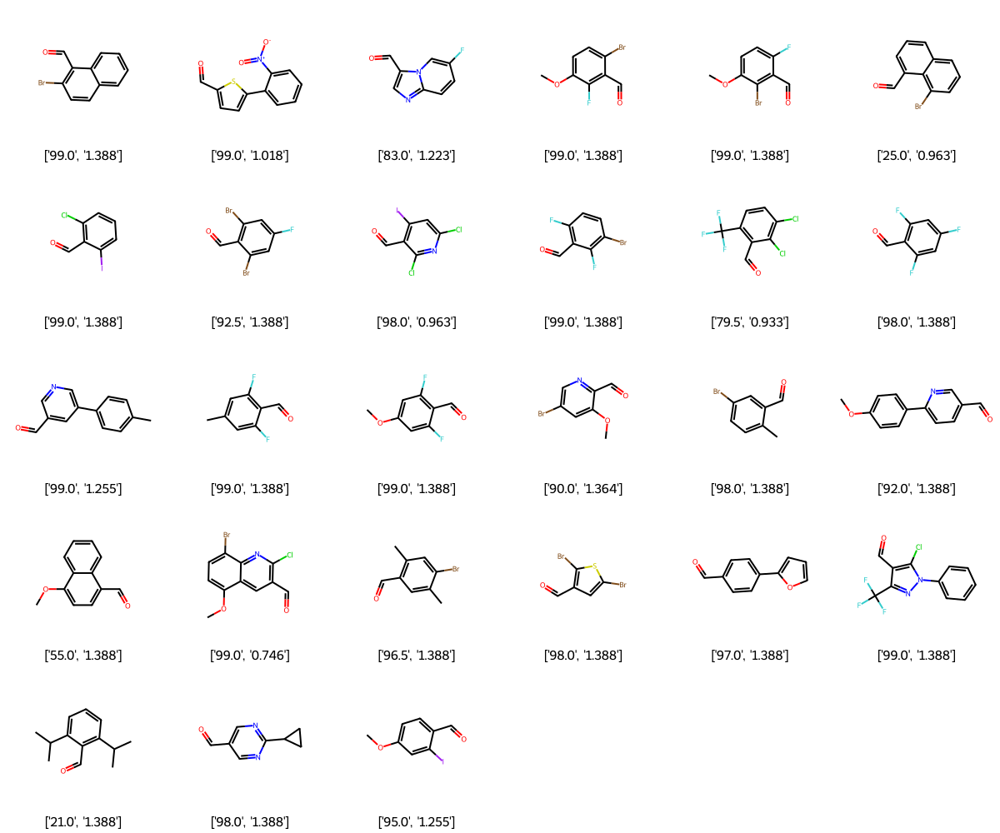

In [7]:
print(f"UMAPs for ScopeBO:\n")
seed = None
for obj in objectives:
    print(f"UMAP for the objective {obj}")
    seed = get_umap(name_results=f"./Results_Data/scope_balanced_pruning", bounds=bounds, figsize = (3.63, 2.7), objective = obj, show_colorbar=True)
Benchmark().show_scope(filename_data=f"27balanced_b3_V13_s{seed}.csv", name_results=f"./Results_Data/scope_balanced_pruning/raw_data", by_round=False,
                    round_values=3)
print(f"UMAPs for Regular BO (EI):\n")
for obj in objectives:
    print(f"UMAP for the objective {obj}")
    get_umap(name_results=f"./Results_Data/scope_balanced_no-pruning", bounds = bounds, hyperpar="balanced_b3_V0", 
             seed=seed, figsize = (3.63, 2.7), objective = obj, show_colorbar=True)
Benchmark().show_scope(filename_data=f"27balanced_b3_V0_s{seed}.csv", name_results=f"./Results_Data/scope_balanced_no-pruning/raw_data", by_round=False,
                    round_values=3)
print(f"UMAPs for conventional selection:\n")
for obj in objectives:
    print(f"UMAP for the objective {obj}")
    get_umap(name_results=f"./Results_Data/scope_human-like-acq", hyperpar="greedy_b3_V5", seed = seed, bounds = bounds, figsize = (3.63, 2.7), show_colorbar=True, objective = obj)
Benchmark().show_scope(filename_data=f"27greedy_b3_V5_s{seed}.csv", name_results=f"./Results_Data/scope_human-like-acq/raw_data", by_round=False,
                    round_values=3)